In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import signal
import scipy as sc

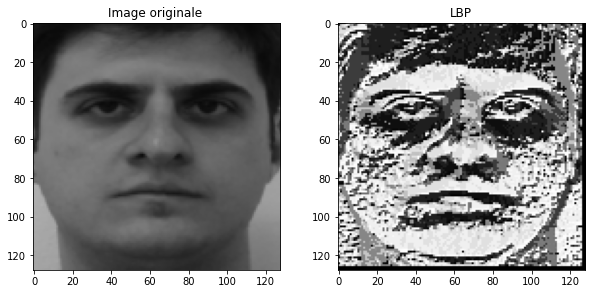

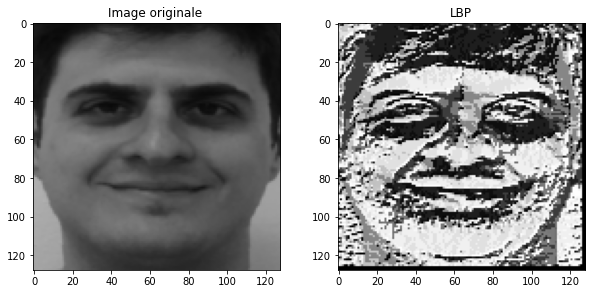

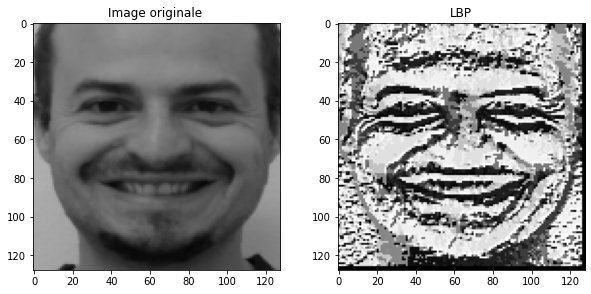

In [19]:
import cv2
import numpy as np  

def calcul_lbp(im):
    res = np.zeros(im.shape,dtype=im.dtype)
    for i in range(1,im.shape[0]-1):
        for j in range(1,im.shape[1]-1):
            pass
            centre = im[i][j]
            code = 0;  
            code |= (im[i-1][j-1] >= centre) * 128;  
            code |= (im[i-1][j  ] >= centre) * 64;  
            code |= (im[i-1][j+1] >= centre) * 32;  
            code |= (im[i  ][j+1] >= centre) * 16;  
            code |= (im[i+1][j+1] >= centre) * 8;  
            code |= (im[i+1][j  ] >= centre) * 4;  
            code |= (im[i+1][j-1] >= centre) *2;  
            code |= (im[i  ][j-1] >= centre) *0;  
            res[i-1][j-1]= code;  
    return res
 
image=cv2.imread('1a.jpg')
image=cv2.resize(image, (128,128), interpolation = cv2.INTER_AREA)
lbp=calcul_lbp(image)  
image2=cv2.imread('1b.jpg')
image2=cv2.resize(image2, (128,128), interpolation = cv2.INTER_AREA)
lbp2=calcul_lbp(image2) 

image3=cv2.imread('6b.jpg')
image3=cv2.resize(image3, (128,128), interpolation = cv2.INTER_AREA)
lbp3=calcul_lbp(image3) 
        
plt.figure(figsize = (10,10))
plt.subplot(2,2,1)
plt.imshow(image, cmap = 'gray')
plt.title("Image originale ")
plt.subplot(2,2,2)
plt.title("LBP")
plt.imshow(lbp,cmap='gray')


plt.figure(figsize = (10,10))
plt.subplot(2,2,1)
plt.imshow(image2, cmap = 'gray')
plt.title("Image originale ")
plt.subplot(2,2,2)
plt.title("LBP")
plt.imshow(lbp2,cmap='gray')

plt.figure(figsize = (10,10))
plt.subplot(2,2,1)
plt.imshow(image3, cmap = 'gray')
plt.title("Image originale ")
plt.subplot(2,2,2)
plt.title("LBP")
plt.imshow(lbp3,cmap='gray')

<ipython-input-12-0b84922c58bc>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


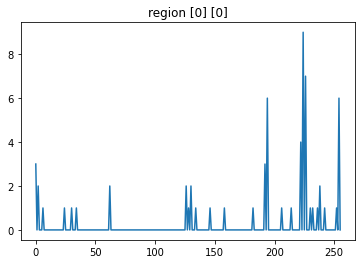

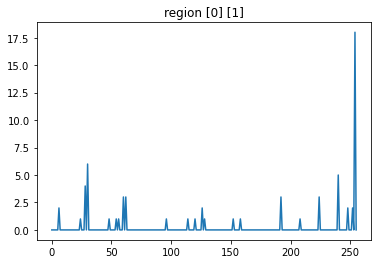

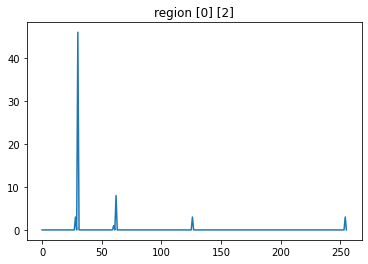

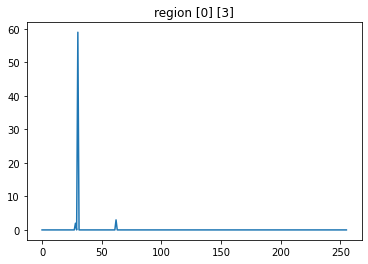

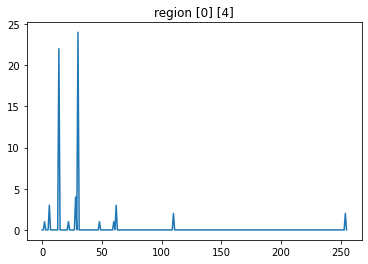

...

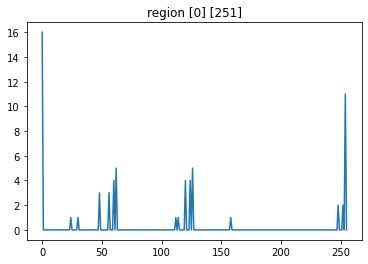

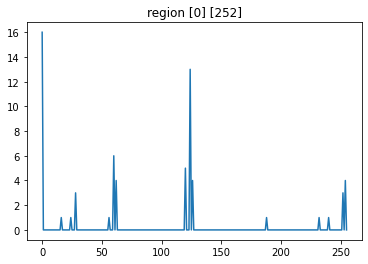

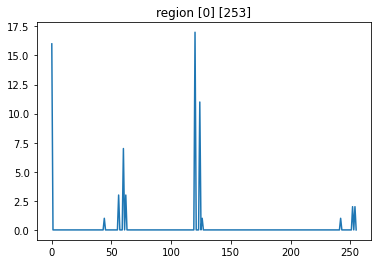

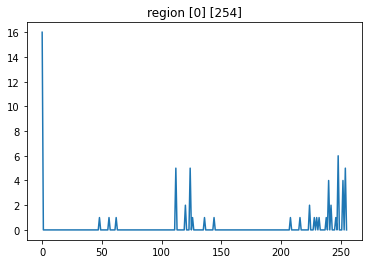

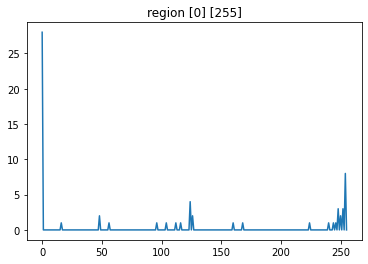

In [12]:
lbp_arr=np.array(lbp)
lbp_arr2=np.array(lbp2)
lbp_arr3=np.array(lbp3)

def hists(image,titre):
    H = np.zeros([256])
    for x in range(0, image.shape[0]):
        for y in range(0, image.shape[1]):
            H[image[x,y]]=H[image[x,y]]+1
    plt.plot(H)
    plt.title(titre)
    return H

def regions(image): 
    reg=[[]]
    concat=[[]]
    for i in range(0,image.shape[0],8):
        for j in range(0,image.shape[1],8):
            reg[-1].append(image[i:i+8,j:j+8])
    for m in range(len(reg)):
        for n in range(len(reg[-1])):
            plt.figure()
            H=hists(reg[m][n],'region ['+ str(m)+'] ['+ str(n)+']')
            concat[-1].extend(H)
    return concat

    


c1=regions(lbp_arr)


        
   

<ipython-input-12-0b84922c58bc>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


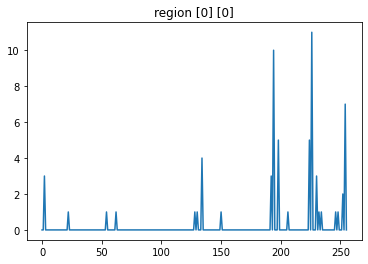

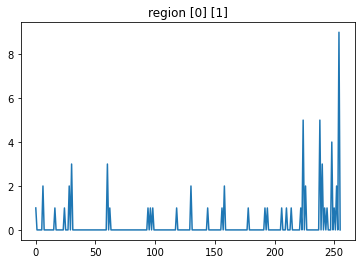

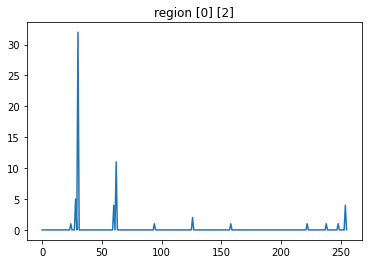

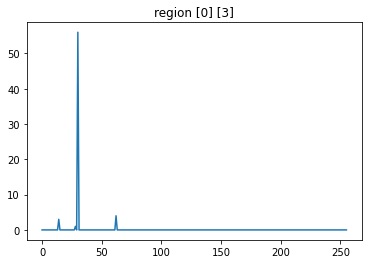

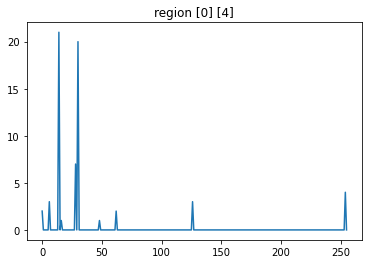

...

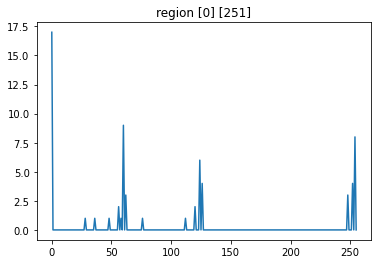

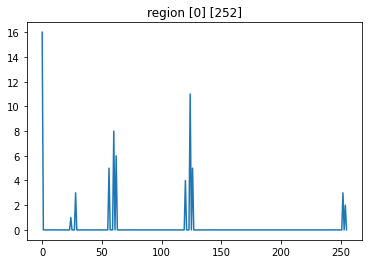

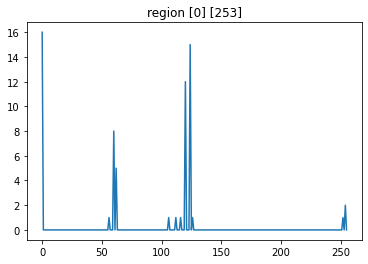

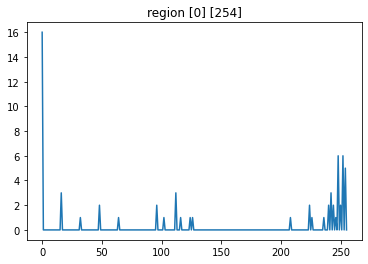

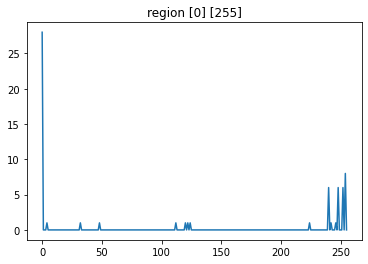

In [13]:
c2=regions(lbp_arr2)

<ipython-input-12-0b84922c58bc>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


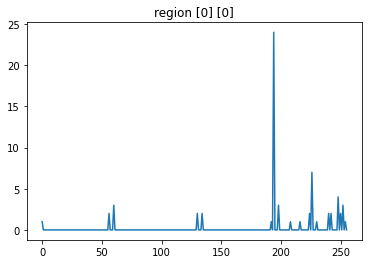

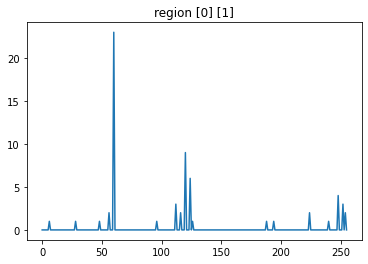

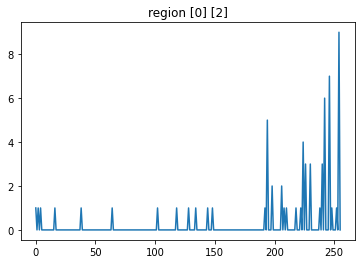

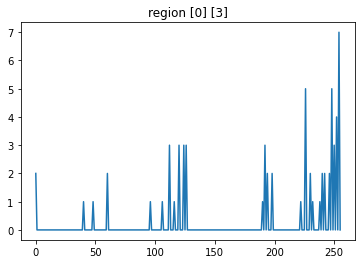

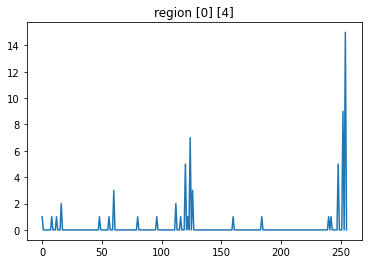

...

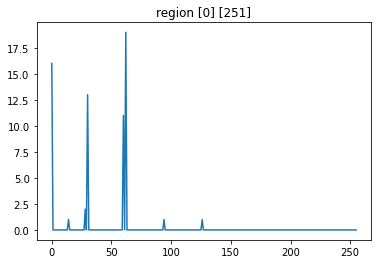

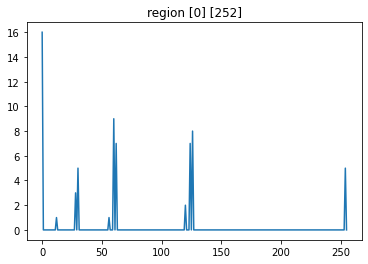

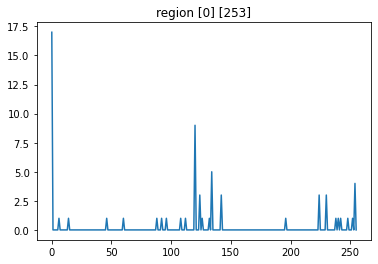

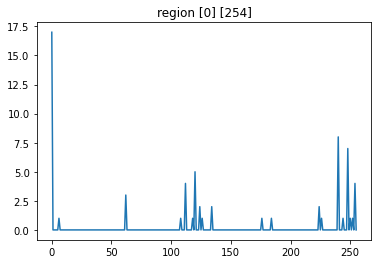

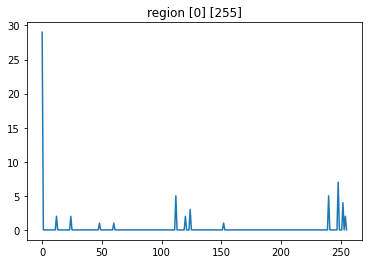

In [14]:
c3=regions(lbp_arr3)

In [15]:
from sklearn.metrics import mean_squared_error
mean_squared_error(c1,c1)

0.0

In [16]:
mean_squared_error(c1,c2)

0.832366943359375

In [17]:
mean_squared_error(c1,c3)

2.61279296875